# Clustering and Dimensionality Reduction

<a href="?print-pdf">print view</a>  
<a href="ClusteringAndDimensionalityReduction.ipynb" download>notebook</a>

# What is clustering?

> ## Grouping similar objects together based on features describing the objects.
> > ### It is used in a lot of different fields.
> > > #### (e.g. biology, medicine, astronomy, finance, geology, climatology, ...)


# Why is clustering important in computational biology?

> ## - Grouping genes, proteins, cells into groups based on expression, structural, or functional similarities.
> ## - Discovering patterns
> ## - Pre-processing step in downstream stream computational analysis.


# Assumptions behind clustering
> ## - Biological data has inherent organization and pattern
> ## - Assumption: Similar objects within the data that have similar organization/patterns.
> ## - Goal: Use mathematics and computation to leverage this similarity and group the objects together.

# Let's start with a classical example: IRIS dataset

**The IRIS dataset contains measurements of 150 iris flowers from 3 species:**
> - Setosa
> - Versicolor  
> - Virginica

**Each flower has 4 features:**
> - Sepal length (cm)
> - Sepal width (cm)
> - Petal length (cm)
> - Petal width (cm)

In [153]:
import pandas as pd
from sklearn.datasets import load_iris

# Load IRIS dataset
iris = load_iris()

In [154]:
X = iris.data # object features
y = iris.target # object labels

feature_names = iris.feature_names
target_names = iris.target_names

In [156]:
print(X[:5,:]) #print first 5 rows of X
print(y) # print object labels

[[5.1 3.5 1.4 0.2]
 [4.9 3.  1.4 0.2]
 [4.7 3.2 1.3 0.2]
 [4.6 3.1 1.5 0.2]
 [5.  3.6 1.4 0.2]]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2]


In [157]:
print(X.shape)
print(len(y))
print(feature_names)
print(target_names)

(150, 4)
150
['sepal length (cm)', 'sepal width (cm)', 'petal length (cm)', 'petal width (cm)']
['setosa' 'versicolor' 'virginica']


In [159]:
# Create a DataFrame for easier manipulation
df = pd.DataFrame(X, columns=feature_names)
df['species'] = pd.Categorical.from_codes(y, target_names) 

In [89]:
print(df.head())

   sepal length (cm)  sepal width (cm)  petal length (cm)  petal width (cm)  \
0                5.1               3.5                1.4               0.2   
1                4.9               3.0                1.4               0.2   
2                4.7               3.2                1.3               0.2   
3                4.6               3.1                1.5               0.2   
4                5.0               3.6                1.4               0.2   

  species  
0  setosa  
1  setosa  
2  setosa  
3  setosa  
4  setosa  


In [160]:
print(pd.Categorical.from_codes(y, target_names))

['setosa', 'setosa', 'setosa', 'setosa', 'setosa', ..., 'virginica', 'virginica', 'virginica', 'virginica', 'virginica']
Length: 150
Categories (3, object): ['setosa', 'versicolor', 'virginica']


<Figure size 500x500 with 0 Axes>

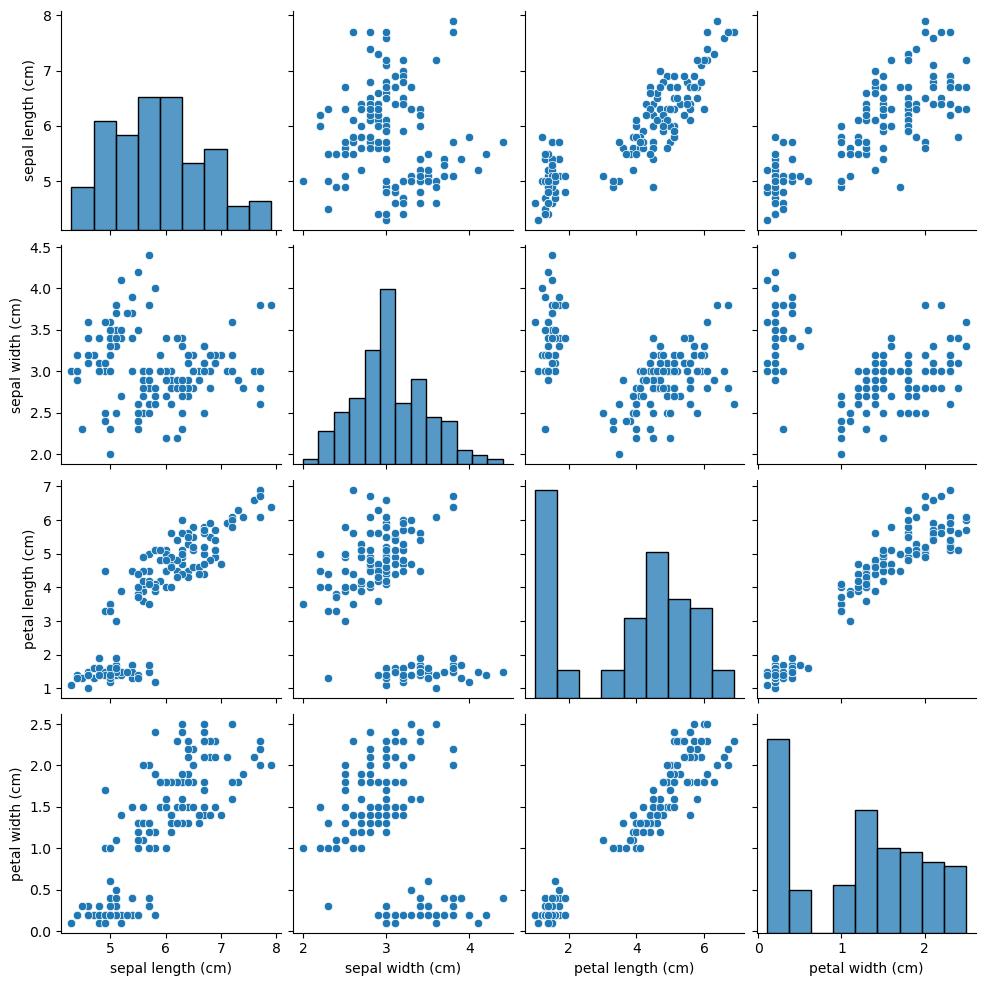

In [118]:
import seaborn as sns
from matplotlib import pyplot as plt
fig1 = plt.figure(figsize=(5, 5))
sns.pairplot(df)

In [161]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

kmeans = KMeans(n_clusters=3, init='random', n_init=10, random_state=42)
cluster_labels = kmeans.fit_predict(X_scaled)

In [162]:
cluster_labels_category = pd.Categorical.from_codes(cluster_labels, target_names)
df['cluster'] = cluster_labels_category

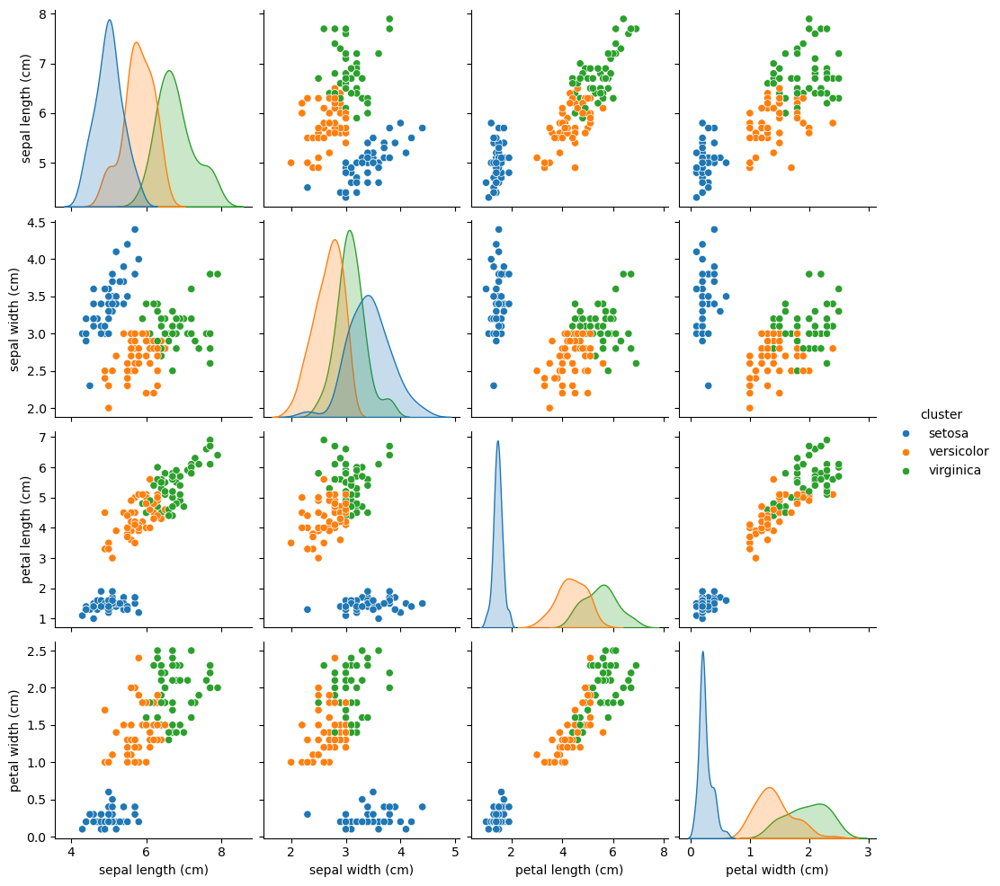

In [163]:
sns.pairplot(df,hue='cluster')

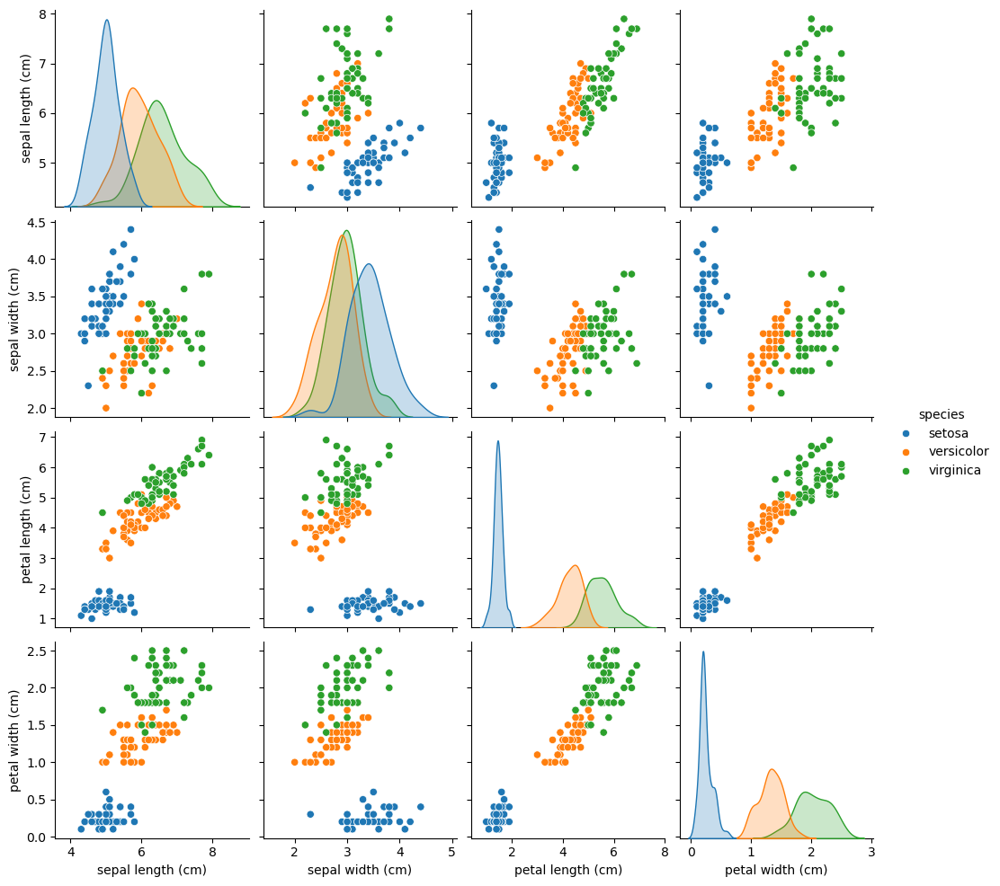

In [164]:
sns.pairplot(df,hue='species')

In [119]:
from sklearn.metrics import confusion_matrix
conf_matrix = confusion_matrix(y, cluster_labels)

print("Confusion Matrix:")
print("(Rows = True Species, Columns = Predicted Clusters)\n")
conf_df = pd.DataFrame(conf_matrix, 
                       index=target_names,
                       columns=[f'Cluster {i}' for i in range(3)])

print(conf_df)

Confusion Matrix:
(Rows = True Species, Columns = Predicted Clusters)

            Cluster 0  Cluster 1  Cluster 2
setosa             50          0          0
versicolor          0         38         12
virginica           0         14         36


# Digression into dimesionality reduction

## Representing high-dimensional data using a lower number of features (dimensions) while ensuring that original data’s meaningful properties are still captured

## An Example

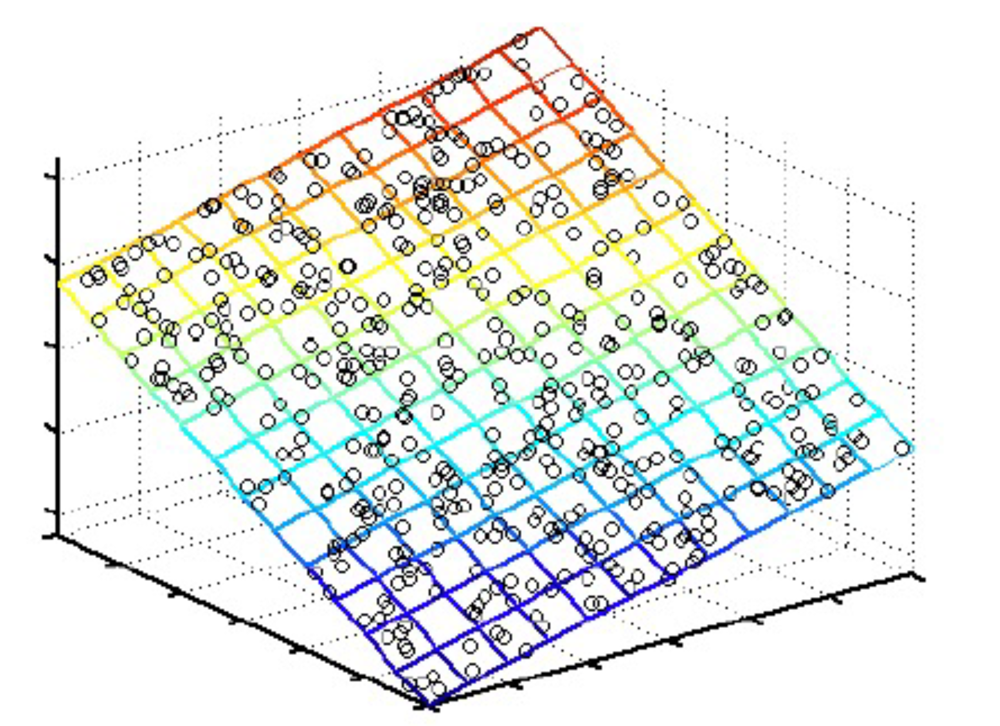


## Principal component analysis finds an orthogonal basis that best represents the variance in the data.

<img width="400" src="https://upload.wikimedia.org/wikipedia/commons/thumb/f/f5/GaussianScatterPCA.svg/1280px-GaussianScatterPCA.svg.png">

In [170]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2);
X_pca = pca.fit_transform(X_scaled)
#Get cluster centers in PCA
centers_pca = pca.transform(kmeans.cluster_centers_)

Text(0.5, 1.0, 'Kmeans prediction')

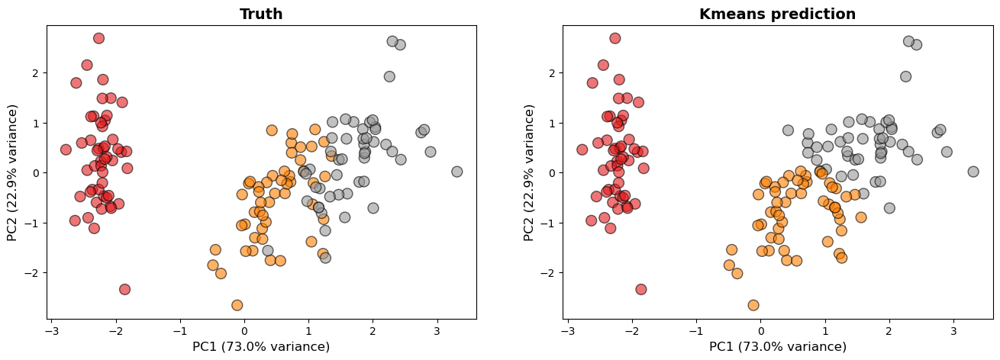

In [165]:
fig, axes = plt.subplots(1,2, figsize = (16,5))
scatter1 = axes[0].scatter(X_pca[:,0],X_pca[:,1], c=y, cmap='Set1', s=100, alpha=0.6, edgecolors='black')
axes[0].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% variance)', fontsize=12)
axes[0].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% variance)', fontsize=12)
axes[0].set_title('Truth', fontsize=14, fontweight='bold')


scatter2 = axes[1].scatter(X_pca[:,0],X_pca[:,1], c=cluster_labels, cmap='Set1', s=100, alpha=0.6, edgecolors='black')
axes[1].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% variance)', fontsize=12)
axes[1].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% variance)', fontsize=12)
axes[1].set_title('Kmeans prediction', fontsize=14, fontweight='bold')


# So what is PCA doing
> ## Standardize the dataset
> ## Compute covariance matrix
> ## Compute eigenvalues and eigenvectors
> ## Identify the eigenvectors corresponding to the largest two eigenvalues.
> ## Project data on the two eigenvectors.

In [166]:
import numpy as np
# Compute covariance matrix
cov_matrix = np.cov(X_scaled.T)
print(cov_matrix)

[[ 1.00671141 -0.11835884  0.87760447  0.82343066]
 [-0.11835884  1.00671141 -0.43131554 -0.36858315]
 [ 0.87760447 -0.43131554  1.00671141  0.96932762]
 [ 0.82343066 -0.36858315  0.96932762  1.00671141]]


In [167]:
# Step 4: Compute eigenvalues and eigenvectors
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)
print(eigenvalues[0:2]/eigenvalues.sum()*100)

[72.96244541 22.85076179]


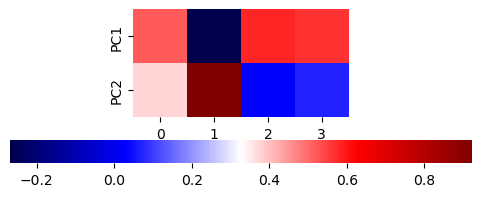

In [168]:
from matplotlib.pylab import cm
plt.figure(figsize=(16,2))
sns.heatmap(pca.components_,cmap=cm.seismic,yticklabels=['PC1','PC2'],
            square=True, cbar_kws={"orientation": "horizontal"});

# Hierarchical clustering 

**Building a tree-like structure - a hierarchy - of clusters**, with

>- Each data point starts as its own cluster (Agglomerative/Bottom-up) OR all points start as one cluster (Divisive/Top-down)
>- Clusters are progressively merged (or split)
>- The result is a nested hierarchy showing relationships at all levels

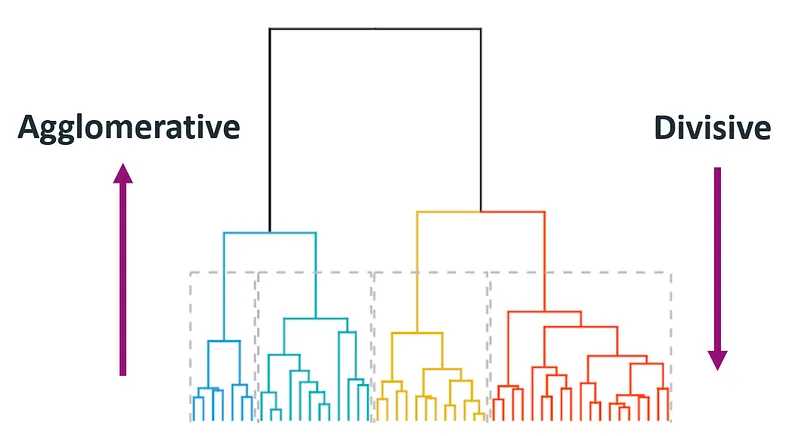

# Linkages
## Single Linkage
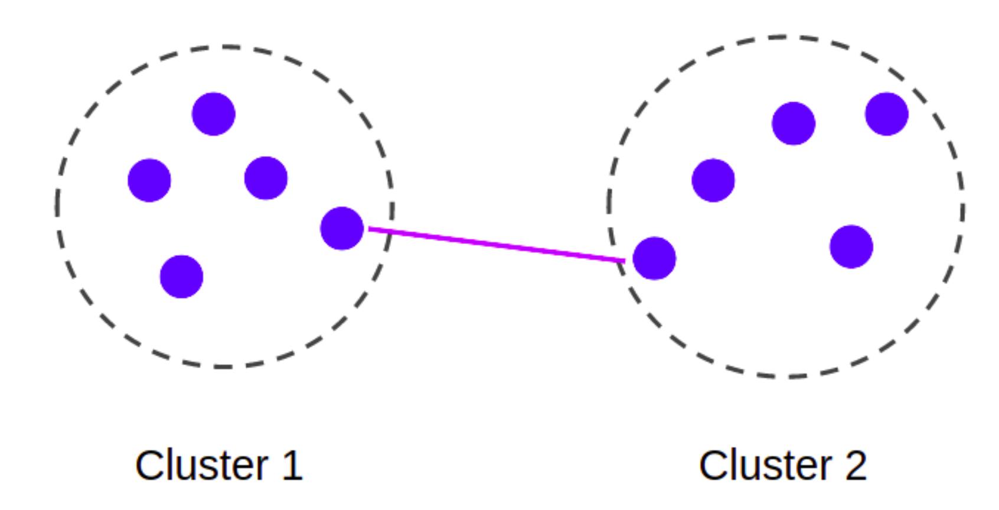

## Complete Linkage
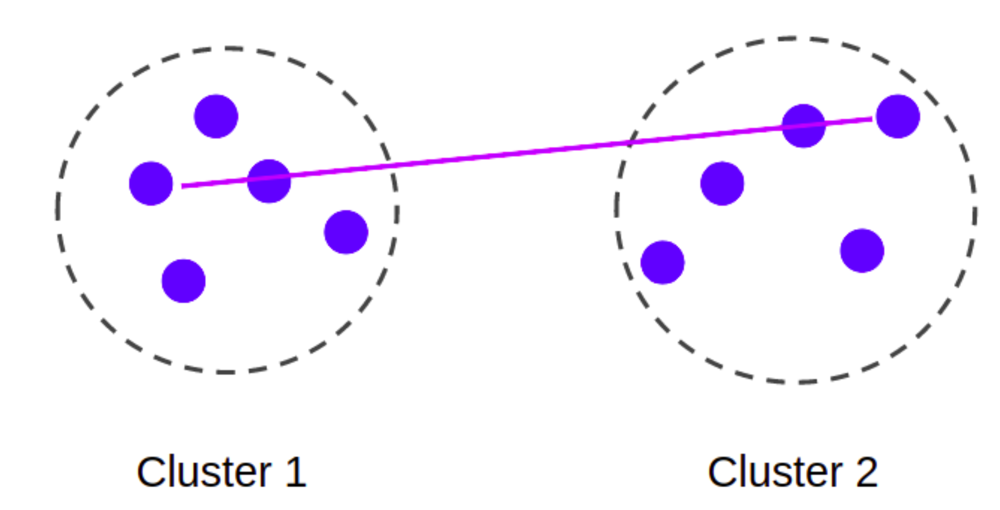

## Average Linkage
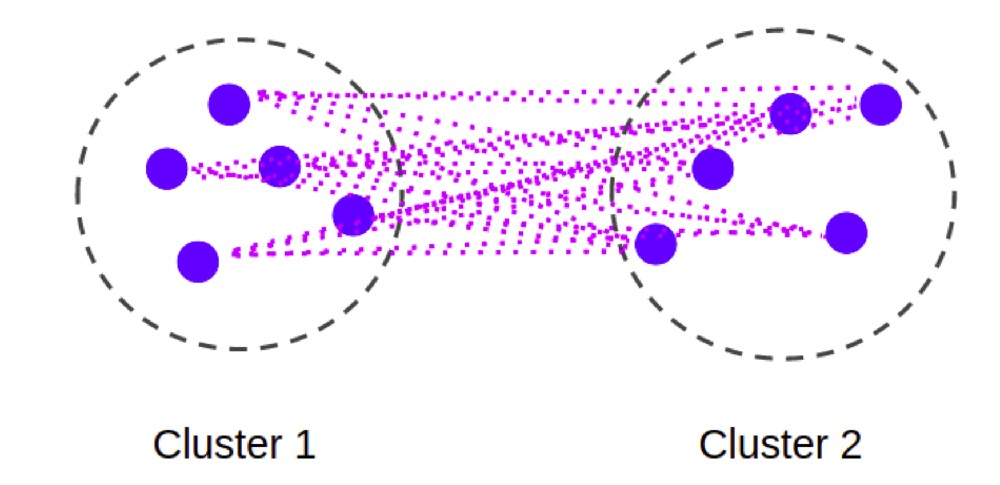

## Ward Linkage
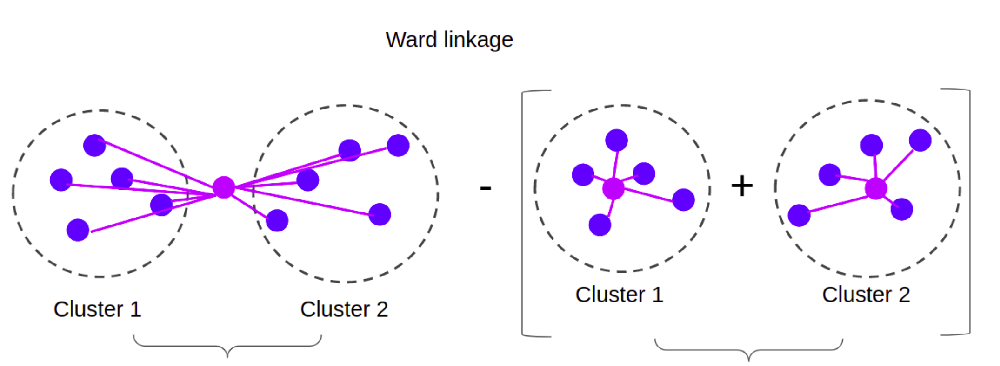

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets

# Set random seed for reproducibility
np.random.seed(42)

# Generate datasets
def generate_datasets():
    """Generate various datasets similar to the image"""
    datasets_list = []
    
    # 1. Concentric circles
    noisy_circles = datasets.make_circles(n_samples=300, factor=0.5, noise=0.05)
    datasets_list.append(('Circles', noisy_circles[0], noisy_circles[1]))
    
    # 2. Noisy moons
    noisy_moons = datasets.make_moons(n_samples=300, noise=0.05)
    datasets_list.append(('Moons', noisy_moons[0], noisy_moons[1]))
    
    # 3. Blobs (varied)
    blobs = datasets.make_blobs(n_samples=300, centers=3, cluster_std=0.5, random_state=8)
    datasets_list.append(('Blobs', blobs[0], blobs[1]))
    
    # 4. Anisotropic blobs
    X, y = datasets.make_blobs(n_samples=300, centers=3, random_state=42)
    transformation = [[0.6, -0.6], [-0.4, 0.8]]
    X_aniso = np.dot(X, transformation)
    datasets_list.append(('Anisotropic', X_aniso, y))
    
    # 5. Different variances
    varied = datasets.make_blobs(n_samples=300, centers=3, 
                                  cluster_std=[1.0, 2.5, 0.5], random_state=42)
    datasets_list.append(('Varied', varied[0], varied[1]))
    
    return datasets_list


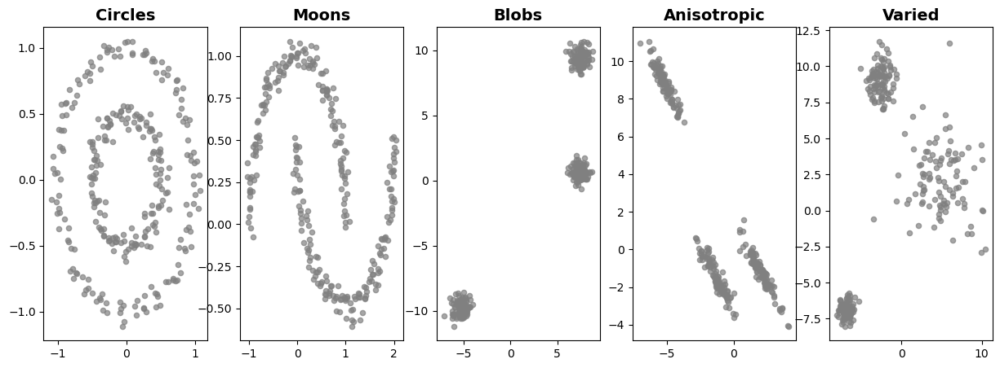

In [5]:
datasets_list = generate_datasets()
linkage_methods = ['single', 'average', 'complete', 'ward']
fig, axes = plt.subplots(1, len(datasets_list), figsize=(15, 5));
cnt = 0;
for ax in axes:
    ax.scatter(datasets_list[cnt][1][:,0], datasets_list[cnt][1][:,1],
                 color='gray',s=20,alpha=0.7);
    ax.set_title(datasets_list[cnt][0], fontsize=14, fontweight='bold')
    cnt += 1;

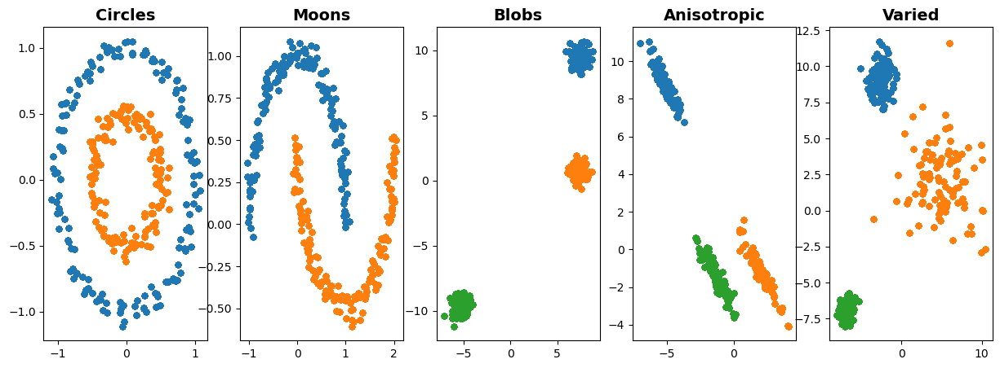

In [6]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']  # Blue, Orange, Green
fig, axes = plt.subplots(1, len(datasets_list), figsize=(15, 5));
cnt = 0;
for ax in axes:
    for label in datasets_list[cnt][2]:
        mask = datasets_list[cnt][2] == label
        ax.scatter(datasets_list[cnt][1][mask,0], datasets_list[cnt][1][mask,1], c=colors[label.astype('uint8')], s=20,alpha=0.7);
        ax.set_title(datasets_list[cnt][0], fontsize=14, fontweight='bold')
    cnt += 1;

In [14]:
# Hierarchical clustering with different linkage methods
def perform_clustering(X, method='single', n_clusters=3):
    """Perform hierarchical clustering"""
    # Standardize features
    X_scaled = StandardScaler().fit_transform(X)
    
    # Perform hierarchical clustering
    start_time = time.time()
    Z = linkage(X_scaled, method=method)
    elapsed_time = time.time() - start_time
    
    # Get cluster labels
    labels = fcluster(Z, n_clusters, criterion='maxclust')
    
    return labels, elapsed_time

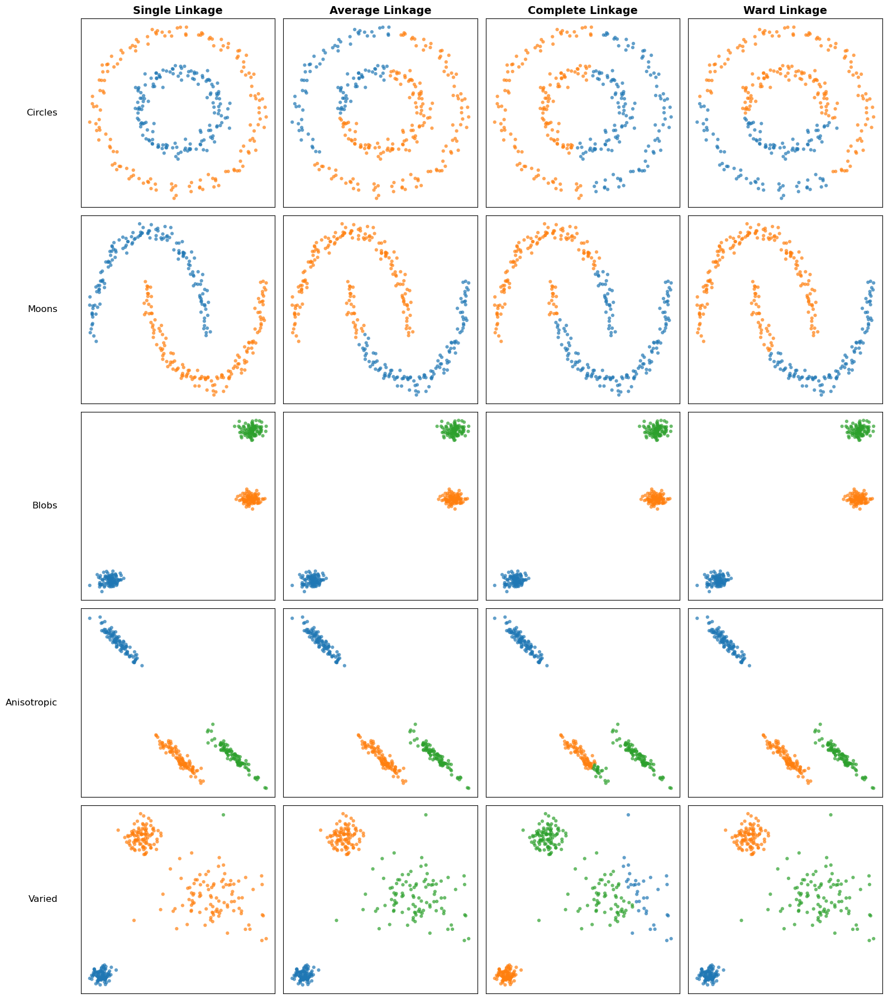

In [17]:
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import fcluster
from sklearn.preprocessing import StandardScaler
import time

linkage_methods = ['single', 'average', 'complete', 'ward']
    
fig, axes = plt.subplots(len(datasets_list), len(linkage_methods), 
                             figsize=(16, 18))
    
# Color map
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']  # Blue, Orange, Green
true_clusters=[2,2,3,3,3,1];
cnt=0;
for i, (dataset_name, X, y_true) in enumerate(datasets_list):
    for j, method in enumerate(linkage_methods):
        ax = axes[i, j]
            
        # Perform clustering
        labels, elapsed_time = perform_clustering(X, method=method, n_clusters=true_clusters[cnt])
            
        # Plot the results
        for cluster_id in range(1, 4):
            mask = labels == cluster_id
            ax.scatter(X[mask, 0], X[mask, 1], 
                          c=colors[cluster_id-1], s=20, alpha=0.7,
                          edgecolors='none')
            
        # Remove axes
        ax.set_xticks([])
        ax.set_yticks([])
            
      
        # Add column titles
        if i == 0:
           title = method.replace('_', ' ').title() + ' Linkage'
           ax.set_title(title, fontsize=14, fontweight='bold')
            
        # Add row labels
        if j == 0:
            ax.set_ylabel(dataset_name, fontsize=12, rotation=0, 
                    ha='right', va='center', labelpad=30)
    cnt += 1;
plt.tight_layout()
plt.show()
    

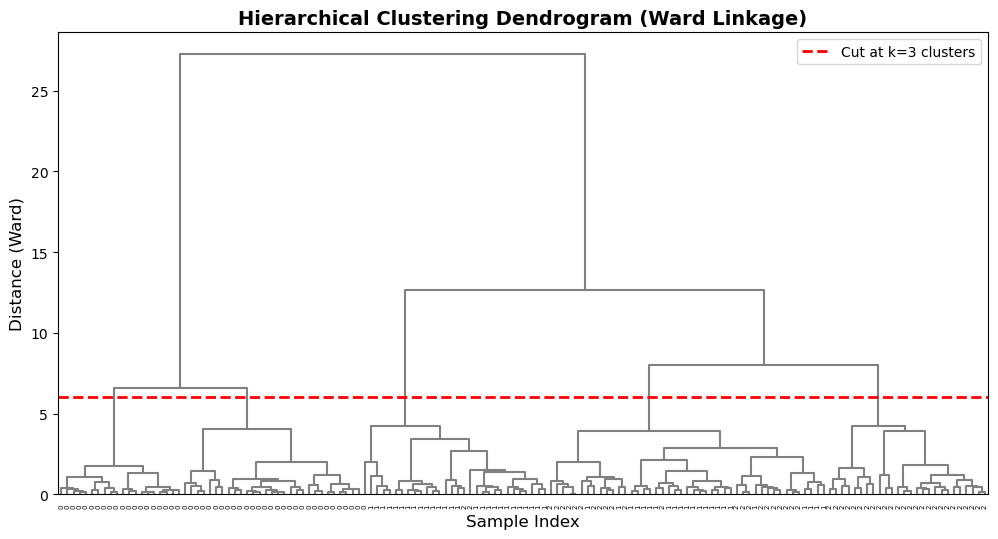

Created 3 clusters
Cluster sizes: [np.int64(49), np.int64(30), np.int64(71)]


In [169]:
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram

# 1. Load and standardize IRIS data
iris = load_iris()
X = iris.data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 2. Perform hierarchical clustering
Z = linkage(X_scaled, method='ward')

# 3. Cut dendrogram to get 3 clusters
clusters = fcluster(Z, t=3, criterion='maxclust') - 1

# 4. Visualize dendrogram
fig, ax = plt.subplots(figsize=(12, 6))

# Create dendrogram
dendrogram(Z, ax=ax, 
           labels=y,  # Color by true species
           color_threshold=0,
           above_threshold_color='gray')

ax.set_title('Hierarchical Clustering Dendrogram (Ward Linkage)', 
             fontsize=14, fontweight='bold')
ax.set_xlabel('Sample Index', fontsize=12)
ax.set_ylabel('Distance (Ward)', fontsize=12)

# Add horizontal line showing where we cut for k=3
ax.axhline(y=6, color='red', linestyle='--', linewidth=2, 
           label='Cut at k=3 clusters')
ax.legend(fontsize=10)
plt.show()

print(f"Created {len(set(clusters))} clusters")
print(f"Cluster sizes: {[sum(clusters == i) for i in range(3)]}")

# Different types of dimensionality reduction approaches
## Linear
- Principal Component Analysis (PCA)
- Linear Discriminant Analysis (LDA)
## Non-Linear
- t-distributed stochastic neighbor embedding (t-SNE)
- Uniform manifold approximation and projection (UMAP)

# PCA vs LDA

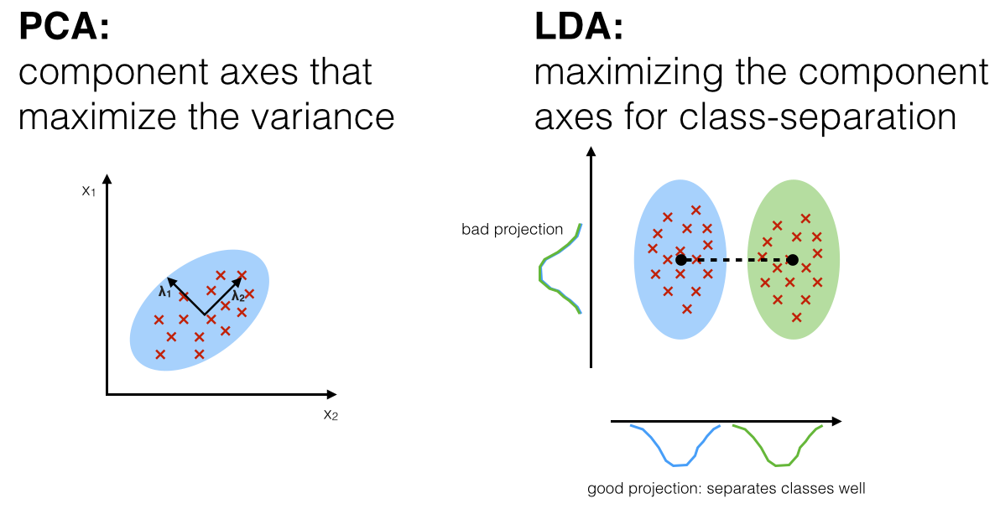

## Now let us consider data on a manifold
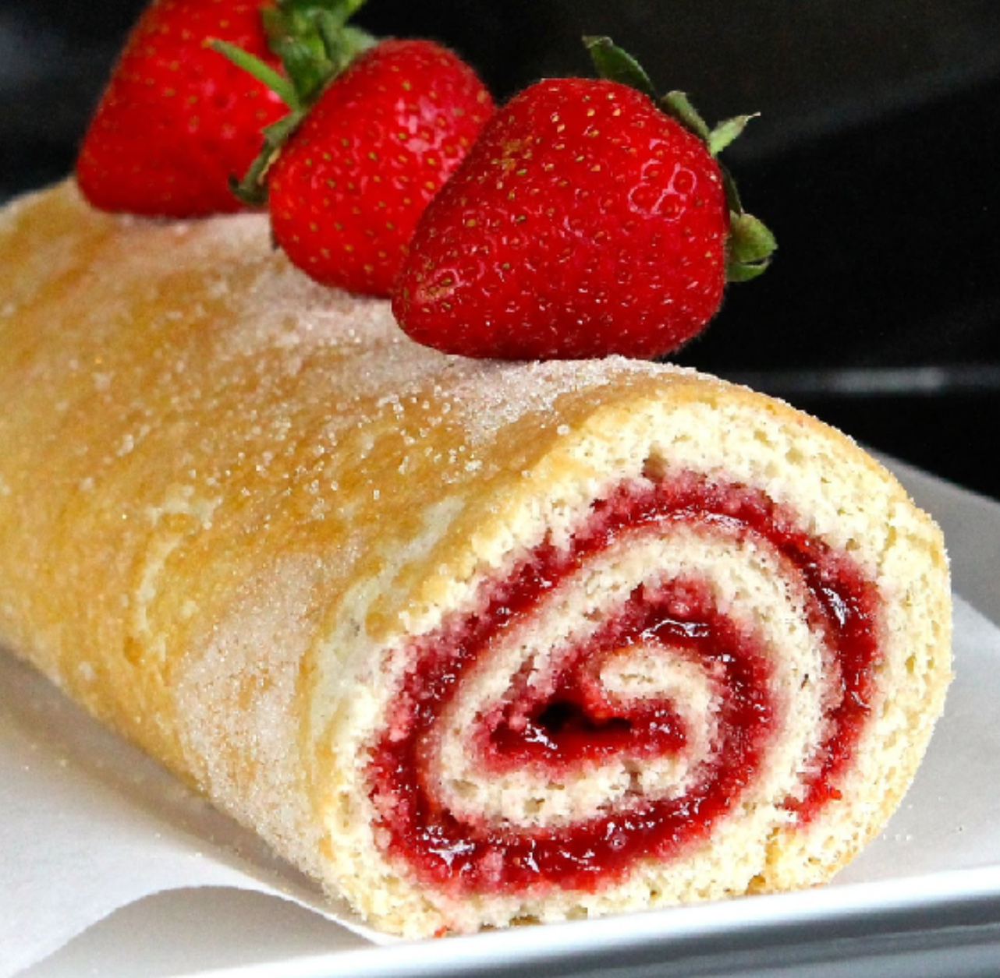

In [21]:
from sklearn.datasets import make_swiss_roll
import matplotlib.pyplot as plt

points, colors = make_swiss_roll(n_samples=3000, random_state=10);

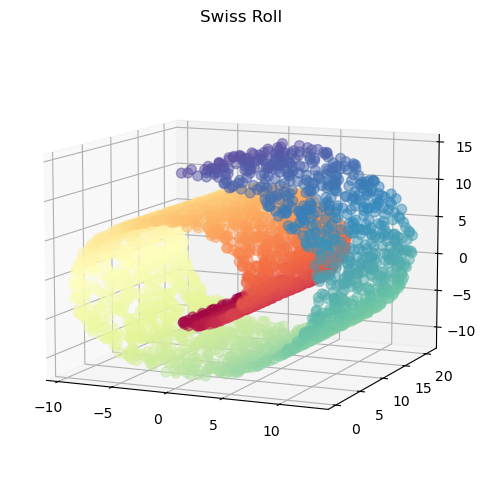

In [22]:
#Let's plot the Swiss roll
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, projection="3d")
fig.add_axes(ax)
ax.scatter(
    points[:, 0], points[:, 1], points[:, 2], c=colors, 
    s=50, alpha=0.5, cmap=plt.cm.Spectral
)
ax.set_title("Swiss Roll")
ax.view_init(azim=-66, elev=10)
#_ = ax.text2D(0.8, 0.05, s="n_samples=1500", transform=ax.transAxes)

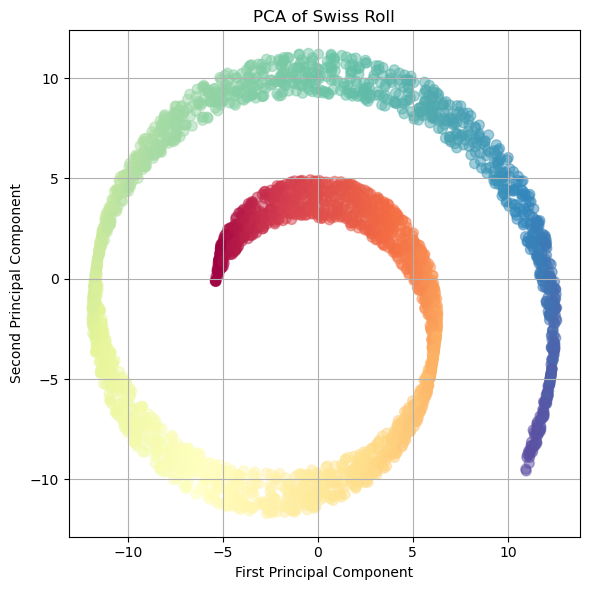

In [23]:
#lets perform PCA on the swiss roll
from sklearn.decomposition import PCA
pca_model = PCA(n_components=2)
pca_result = pca_model.fit_transform(points)

plt.figure(figsize=(6, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=colors, 
            s=50, alpha=0.5, cmap=plt.cm.Spectral)
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('PCA of Swiss Roll')
plt.grid(True)

plt.tight_layout()
plt.show()

In [24]:
# Is the following better 2D projection though?

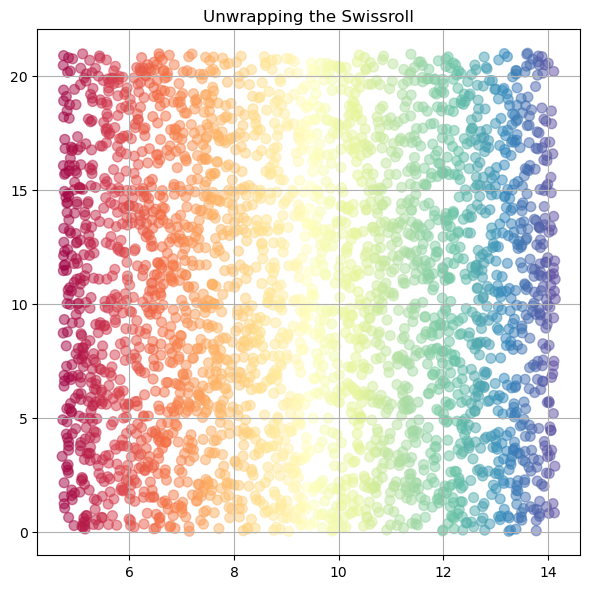

In [25]:
plt.figure(figsize=(6, 6))
plt.scatter(colors,points[:,1], c=colors, s=50, alpha=0.5, cmap=plt.cm.Spectral)
plt.title('Unwrapping the Swissroll')
plt.grid(True)

plt.tight_layout()
plt.show()

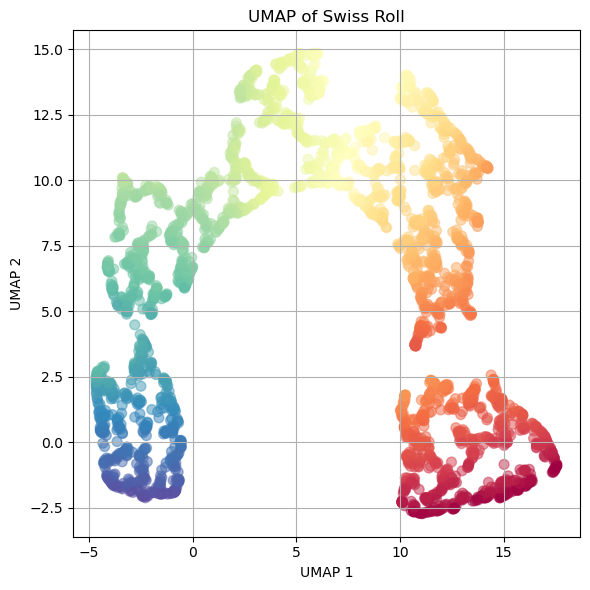

In [27]:
import umap
umap_model = umap.UMAP()
umap_result = umap_model.fit_transform(points, n_neighbors=100, min_dist = .5)

plt.figure(figsize=(6, 6))
plt.scatter(umap_result[:, 0], umap_result[:, 1], c=colors, s=50, alpha=0.5, cmap=plt.cm.Spectral)
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.title('UMAP of Swiss Roll')
plt.grid(True)

plt.tight_layout()
plt.show();

# UMAP: Uniform Manifold Approximation & Projection
 
https://umap-learn.readthedocs.io/en/latest/index.html

Idea: Prioritize respecting **local** distances in embedding space.

<img src="https://umap-learn.readthedocs.io/en/latest/_images/how_umap_works_umap_open_cover.png">

# UMAP: Uniform Manifold Approximation & Projection

UMAP constructs a $k$-nearest neighbors graph of the data.  It uses an approximate **stochastic** algorithm to do this quickly.

<img src="https://umap-learn.readthedocs.io/en/latest/_images/how_umap_works_umap_graph.png">

# UMAP Parameters

* `n_neighbors` (15): Number of nearest neighbors to consider.  Increase to respect global structure more.
* `min_dist` (0.1): Minimum distance between points in reduced space. Decrease to have more tightly clustered points.
* `metric` ("euclidean"): How distance is computed.  Can provide user-supplied functions in addition to standard metrics

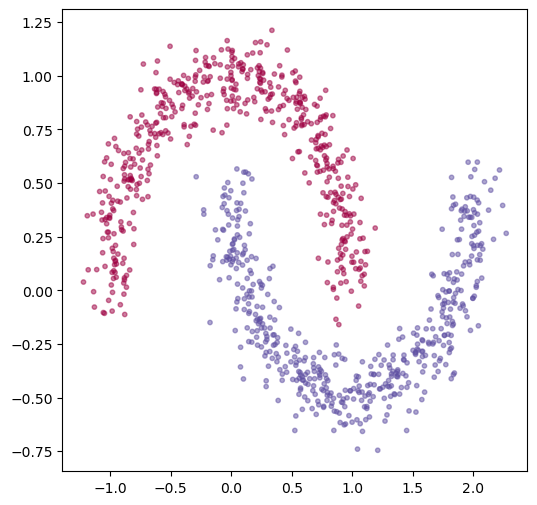

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from umap import UMAP

# Generate synthetic data
n_samples = 1000
X, y = make_moons(n_samples=n_samples, noise=0.1, random_state=42)
plt.figure(figsize=(6, 6))
plt.scatter(X[:, 0], X[:, 1], c=y, s=10, alpha=0.5, cmap=plt.cm.Spectral)

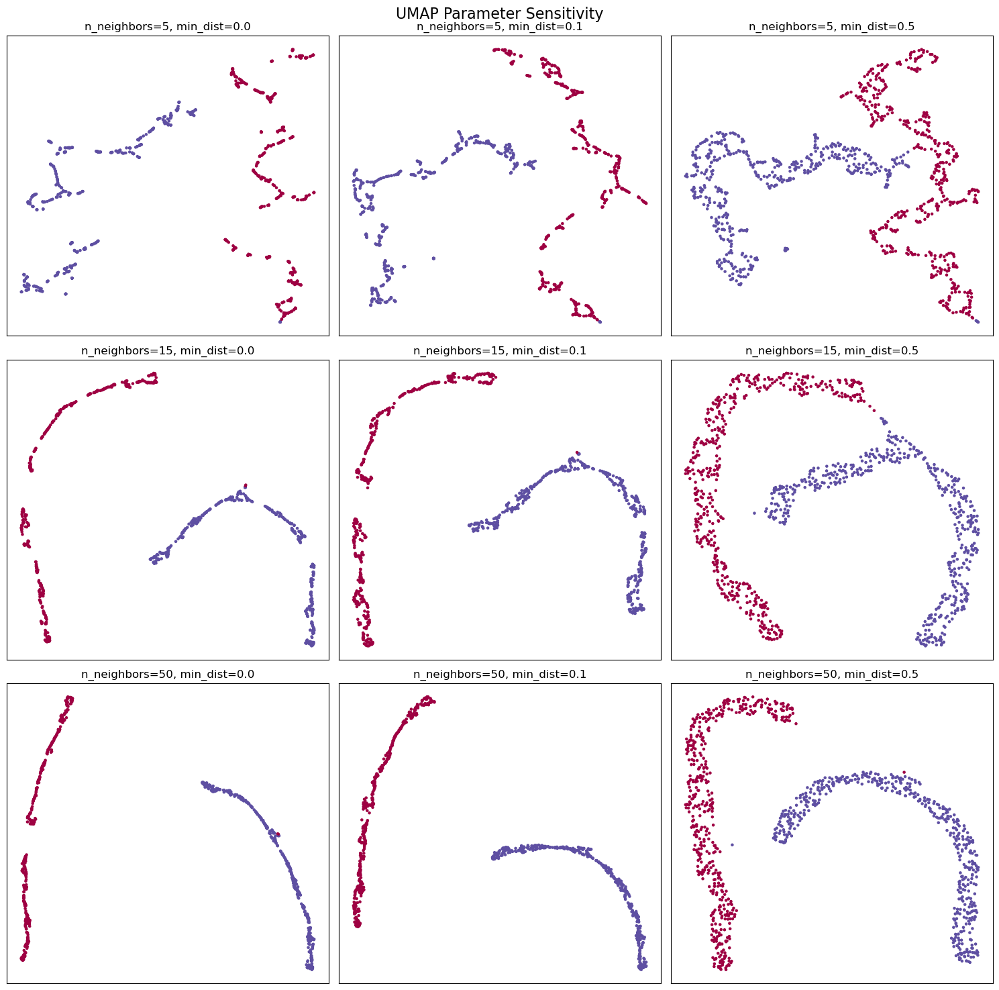

In [30]:
# Set up the plot
fig, axs = plt.subplots(3, 3, figsize=(15, 15))
fig.suptitle("UMAP Parameter Sensitivity", fontsize=16)

# Define parameter ranges
n_neighbors_range = [5, 15, 50]
min_dist_range = [0.0, 0.1, 0.5]

# Generate UMAP projections for different parameter combinations
for i, n_neighbors in enumerate(n_neighbors_range):
    for j, min_dist in enumerate(min_dist_range):
        umap = UMAP(n_neighbors=n_neighbors, min_dist=min_dist, random_state=42, n_jobs=1)
        X_umap = umap.fit_transform(X)
        
        axs[i, j].scatter(X_umap[:, 0], X_umap[:, 1], c=y, cmap=plt.cm.Spectral, s=5)
        axs[i, j].set_title(f'n_neighbors={n_neighbors}, min_dist={min_dist}')
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])

plt.tight_layout()
plt.show()

# Next time

> -**RNA seq**